# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), and so you have four options:
1. Use PaperSpace [as suggested for CW1](https://hackmd.io/@afspies/S1stL8Qnt)
2. Use Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
3. Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
4. Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is 19:00, Friday 25th February, 2022** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'yy3219' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_cw_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [3]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [4]:
# Necessary Hyperparameters 
num_epochs = 30
learning_rate = 1e-3
batch_size = 128
latent_dim = 32 # Choose a value for the size of the latent space

# Additional Hyperparameters 


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

In [5]:
# Use this class in nn.sequential()
class View(nn.Module):
    def __init__(self, shape):
        super(View, self).__init__()
        self.shape = shape
        
    def forward(self, x):
        return x.view(*self.shape)

### Data loading


In [6]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [7]:
# *CODE FOR PART 1.1a IN THIS CELL*
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Define 2 convolutional encoders and 4 fully connected layers for the encoder
        self.encoder = nn.Sequential(nn.Conv2d(1, 16, 3), nn.BatchNorm2d(16), nn.ReLU(),
                                     nn.Conv2d(16, 32, 3), nn.BatchNorm2d(32), nn.ReLU(),
                                     View((-1, 32*24*24)),
                                     nn.Linear(32*24*24, 256), nn.ReLU(),
                                     nn.Linear(256, 128), nn.ReLU())
        self.mean_fc = nn.Linear(128, latent_dim)
        self.logvar_fc = nn.Linear(128, latent_dim)

        
        # Define 3 fully connected layers and 2 convoluntional layers for the decoder
        self.decoder = nn.Sequential(nn.Linear(latent_dim, 128), nn.ReLU(),
                                     nn.Linear(128, 256), nn.ReLU(),
                                     nn.Linear(256, 32*24*24), nn.ReLU(),
                                     View((-1, 32, 24, 24)),
                                     nn.ConvTranspose2d(32, 16, 3), nn.ReLU(),
                                     nn.ConvTranspose2d(16, 1, 3), nn.Sigmoid())
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.encoder(x)
        mu = self.mean_fc(x)
        logvar = self.logvar_fc(x)

        return mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Reparameterization samples from mu + std * eps
        std = torch.exp(logvar/2)
        eps = torch.randn_like(std)

        return mu + std * eps
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.decoder(z)
        return x
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        recon_x = self.decode(z)

        return recon_x, mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 9543937
VAE(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): View()
    (7): Linear(in_features=18432, out_features=256, bias=True)
    (8): ReLU()
    (9): Linear(in_features=256, out_features=128, bias=True)
    (10): ReLU()
  )
  (mean_fc): Linear(in_features=128, out_features=32, bias=True)
  (logvar_fc): Linear(in_features=128, out_features=32, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=32, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=256, bias=True)
    (3): ReLU()
    (4): Linear(in_features=256, out_features=18432, bias=True)
    (5): ReLU()
    (6): View()
    (7): ConvTran

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [8]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta=0.8):
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_loss = F.binary_cross_entropy(recon_x, x, reduction='sum')
    KL_div = -0.5 * torch.sum(1 + logvar - mu**2 - torch.exp(logvar))
    loss = recon_loss + beta * KL_div

    return recon_loss, KL_div, loss
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 


#######################################################################
#                       ** START OF YOUR CODE **
#######################################################################
# Initialise lists of losses
train_loss_list, train_recon_loss_list, train_KL_div_list = [], [], []
test_loss_list, test_recon_loss_list, test_KL_div_list = [], [], []

for epoch in range(num_epochs):  
    model.train() 
    train_loss, train_recon_loss, train_KL_div = 0, 0, 0

    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch): 
            data = data.to(device)
            optimizer.zero_grad()

            # Forward
            recon_batch, mu, logvar = model(data)
            recon_loss, KL_div, loss = [loss/len(data) for loss in loss_function_VAE(recon_batch, data, mu, logvar)]

            # Backpropagation
            loss.backward()
            train_recon_loss += recon_loss.item()
            train_KL_div += KL_div.item()
            train_loss += loss.item()
            optimizer.step()

    # Compute the averaged losses
    train_len = len(loader_train.dataset)
    train_loss, train_recon_loss, train_KL_div = [loss/train_len for loss in [train_loss, train_recon_loss, train_KL_div]]

    train_loss_list.append(train_loss)
    train_recon_loss_list.append(train_recon_loss)
    train_KL_div_list.append(train_KL_div)

    # Evaluate on test data      
    model.eval()
    test_loss, test_recon_loss, test_KL_div = 0, 0, 0

    with tqdm.tqdm(loader_test, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch): 
            data = data.to(device)
            optimizer.zero_grad(set_to_none=True)
            
            recon_batch, mu, logvar = model(data)
            recon_loss, KL_div, loss = [loss/len(data) for loss in loss_function_VAE(recon_batch, data, mu, logvar)]

            test_recon_loss += recon_loss.item()
            test_KL_div += KL_div.item()
            test_loss += loss.item()

    # Compute the averaged losses
    test_len = len(loader_test.dataset)
    test_loss, test_recon_loss, test_KL_div = [loss/test_len for loss in [test_loss, test_recon_loss, test_KL_div]]

    test_loss_list.append(test_loss)
    test_recon_loss_list.append(test_recon_loss)
    test_KL_div_list.append(test_KL_div)

    print('epoch [{}/{}], Training loss:{:.4f}, Testing loss:{:.4f}'.format(epoch + 1, num_epochs, train_loss, test_loss))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    # if batch_idx % 20 == 0:
    #     tepoch.set_description(f"Epoch {epoch}")
    #     tepoch.set_postfix(loss=loss.item()/len(data))

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')


100%|██████████| 79/79 [00:00<00:00, 88.03batch/s]


epoch [1/30], Training loss:1.4165, Testing loss:1.0880


100%|██████████| 79/79 [00:00<00:00, 88.26batch/s]


epoch [2/30], Training loss:0.9808, Testing loss:0.9178


100%|██████████| 79/79 [00:00<00:00, 87.82batch/s]


epoch [3/30], Training loss:0.8834, Testing loss:0.8605


100%|██████████| 79/79 [00:00<00:00, 87.42batch/s]


epoch [4/30], Training loss:0.8408, Testing loss:0.8403


100%|██████████| 79/79 [00:00<00:00, 87.58batch/s]


epoch [5/30], Training loss:0.8186, Testing loss:0.8186


100%|██████████| 79/79 [00:00<00:00, 86.76batch/s]


epoch [6/30], Training loss:0.8039, Testing loss:0.8053


100%|██████████| 79/79 [00:00<00:00, 87.46batch/s]


epoch [7/30], Training loss:0.7899, Testing loss:0.8000


100%|██████████| 79/79 [00:00<00:00, 88.38batch/s]


epoch [8/30], Training loss:0.7813, Testing loss:0.7814


100%|██████████| 79/79 [00:00<00:00, 88.13batch/s]


epoch [9/30], Training loss:0.7730, Testing loss:0.7834


100%|██████████| 79/79 [00:01<00:00, 54.74batch/s]


epoch [10/30], Training loss:0.7669, Testing loss:0.7758


100%|██████████| 79/79 [00:00<00:00, 89.03batch/s]


epoch [11/30], Training loss:0.7619, Testing loss:0.7752


100%|██████████| 79/79 [00:00<00:00, 88.49batch/s]


epoch [12/30], Training loss:0.7581, Testing loss:0.7704


100%|██████████| 79/79 [00:00<00:00, 89.82batch/s]


epoch [13/30], Training loss:0.7543, Testing loss:0.7661


100%|██████████| 79/79 [00:00<00:00, 88.88batch/s]


epoch [14/30], Training loss:0.7512, Testing loss:0.7673


100%|██████████| 79/79 [00:00<00:00, 88.57batch/s]


epoch [15/30], Training loss:0.7471, Testing loss:0.7621


100%|██████████| 79/79 [00:00<00:00, 87.93batch/s]


epoch [16/30], Training loss:0.7447, Testing loss:0.7651


100%|██████████| 79/79 [00:00<00:00, 87.89batch/s]


epoch [17/30], Training loss:0.7423, Testing loss:0.7636


100%|██████████| 79/79 [00:00<00:00, 88.61batch/s]


epoch [18/30], Training loss:0.7398, Testing loss:0.7617


100%|██████████| 79/79 [00:00<00:00, 88.73batch/s]


epoch [19/30], Training loss:0.7371, Testing loss:0.7609


100%|██████████| 79/79 [00:00<00:00, 88.41batch/s]


epoch [20/30], Training loss:0.7355, Testing loss:0.7594


100%|██████████| 79/79 [00:00<00:00, 89.09batch/s]


epoch [21/30], Training loss:0.7336, Testing loss:0.7615


100%|██████████| 79/79 [00:00<00:00, 89.17batch/s]


epoch [22/30], Training loss:0.7317, Testing loss:0.7618


100%|██████████| 79/79 [00:00<00:00, 89.23batch/s]


epoch [23/30], Training loss:0.7299, Testing loss:0.7551


100%|██████████| 79/79 [00:00<00:00, 86.05batch/s]


epoch [24/30], Training loss:0.7283, Testing loss:0.7582


100%|██████████| 79/79 [00:00<00:00, 87.28batch/s]


epoch [25/30], Training loss:0.7265, Testing loss:0.7567


100%|██████████| 79/79 [00:00<00:00, 88.70batch/s]


epoch [26/30], Training loss:0.7250, Testing loss:0.7583


100%|██████████| 79/79 [00:00<00:00, 88.66batch/s]


epoch [27/30], Training loss:0.7235, Testing loss:0.7607


100%|██████████| 79/79 [00:01<00:00, 77.14batch/s]


epoch [28/30], Training loss:0.7222, Testing loss:0.7535


100%|██████████| 79/79 [00:00<00:00, 88.83batch/s]


epoch [29/30], Training loss:0.7208, Testing loss:0.7544


100%|██████████| 79/79 [00:00<00:00, 87.57batch/s]


epoch [30/30], Training loss:0.7203, Testing loss:0.7584


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


**YOUR ANSWER**

The loss function I use is the Beta VAE loss, which is similar to the negation of the variational lower bound $L(\phi, \theta)$, with an additional parameter $\beta$ controlling the weights on the regularisation term:
\begin{equation}
Loss = -\textbf E_{q_{\phi}(z|X)}[\log p_\theta(X|z)] + \beta KL[q_\phi(z|X)||p(z)]
\end{equation}

The reasoning for choosing this loss is as follows:

Ideally, we want to minimise the loss such that the log likelihood $\log p_\theta (X) = \textbf E_{z \sim q_{\phi}(z|X)}[\log p_\theta(X|z)]$ is maximised. However, for VAE, the likelihood is intractable. So instead, we can choose to maximise a tractable lower bound of the likelihood, i.e. the variational lower bound:
\begin{equation}
L(\phi, \theta) = \textbf E_{z \sim q_{\phi}(z|X)}[\log p_\theta(X|z)] -KL[q_\phi(z|X)||p(z)]
\end{equation}

By maximising this lower bound, we are maximising the likelihood and minimising the KL divergence, thus pushing the posterior $q_\phi(z|X)$ as close to the prior $p(z)$ as possible. With a higher value of $\beta$ (e.g. $\beta > 1)$, we can put more weights on the KL term in the objective, thus encourageing more efficient latent encoding and disentanglement.

To compute the reconstruction cost (first term) in the loss function, I use the binary cross entropy loss (the negative average of the log of corrected predicted probabilities) as an approximation, under the assumption that images in MNIST dataset have either black or white pixels.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

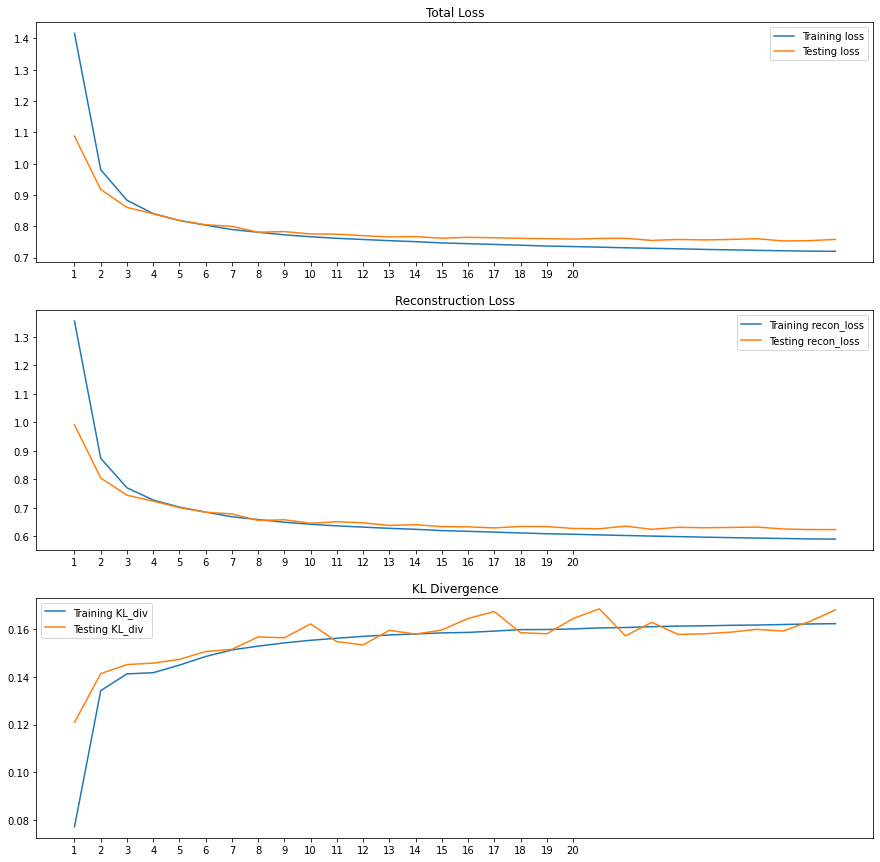

In [9]:
# *CODE FOR PART 1.2a IN THIS CELL*
n = list(range(1, num_epochs+1))
plt.figure(figsize=(15, 15))

# Compare the total loss
plt.subplot(3,1,1)
plt.plot(n, train_loss_list, label='Training loss')
plt.plot(n, test_loss_list, label='Testing loss')
plt.title('Total Loss')
plt.legend()
plt.xticks(range(1,21))

# Compare the reconstruction loss 
plt.subplot(3,1,2)
plt.plot(n, train_recon_loss_list, label='Training recon_loss')
plt.plot(n, test_recon_loss_list, label='Testing recon_loss')
plt.title('Reconstruction Loss')
plt.legend()
plt.xticks(range(1,21))

# Compare the KL divergence
plt.subplot(3,1,3)
plt.plot(n, train_KL_div_list, label='Training KL_div')
plt.plot(n, test_KL_div_list, label='Testing KL_div')
plt.title('KL Divergence')
plt.legend()
plt.xticks(range(1,21))

plt.show()

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


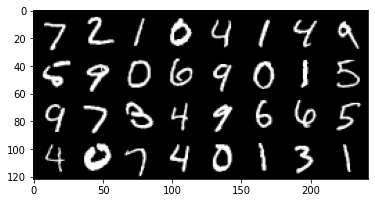

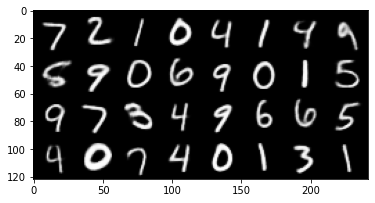

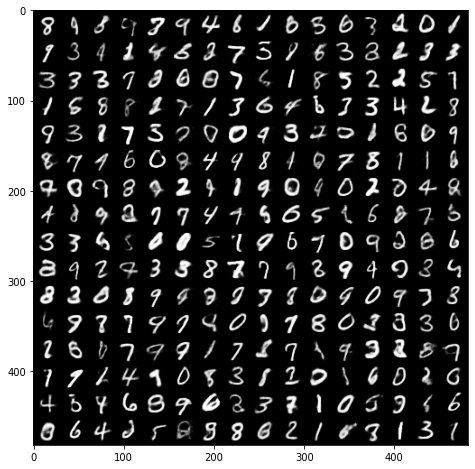

In [10]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, _, _ = model(fixed_input.to(device))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

The log-likelihood loss decreases and the KL loss increases during the training, as shown in the second and third graphs.

This behaviour shows a tradeoff between minimising the log-likehood loss and for the encoded distribution to stay close the the prior (a small KL loss). This trade-off behaviour is desirable, as the total loss (the sum of two losses) still decreases over the training, as shown in the first graph. Also, the training and testing losses have similar values and decreasing trends, showing a good generalization performance of the model.

We say a posterior is collapsing, when signal from input $X$ to posterior parameters is either too weak or too noisy, and as a result, decoder starts ignoring $z$ samples drawn from the posterior $𝑞_\phi(𝑧|𝑥)$. I don't think this is obvious during training, as the KL loss starts at around 0.10 and increases, even at the beginning of training, meaning the posterior is already some distance away from the prior and is utilising observed inputs.

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [11]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE

model.eval()
z_feats = np.empty((0, latent_dim))

with torch.no_grad():
    for data, label in loader_test:
        mu, logvar = model.encode(data.to(device))
        z_feat = model.reparametrize(mu, logvar)
        z_feats = np.concatenate((z_feats, z_feat.cpu().numpy()))

tsne = TSNE(n_components=2, random_state=300, perplexity=50, n_iter=300)
tsne_results = tsne.fit_transform(z_feats)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [12]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(tsne_results, test_dataloader, num_points=2000, darkmode=False)

alt.HConcatChart(...)

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

The graph shows that the digit images with the same label tend to form clusters in the latent space, but the boundaries of clusters are unclear and there is significant overlap between the clusters.

The KL loss is corresponding to the distance between these cluster distributions. The larger KL loss is, i.e. the more distant the encoded latent distribution $q_\phi(z|X)$ is from the prior $p(z)$ (with a standard normal distribution), the more distant and seperated the clusters will be. As we observe significant overlap between the clusters, this means this KL loss is relatively small, which is good as we try to minimise it in the loss function. 

As we increase $\beta$, i.e. the weight on the KL term in the loss function, I observe that the clusters tend to overlap more and show less clear boundaries. This makes sense as a larger $\beta$ pushes more on the posterior to the prior, thus encouraging more efficient latent encoding and disentanglement.

T-SNE may not be entirely reliable. For example, when I decrease perplexity in TSNE from 50 to 5, the data points become much more scattered to the point where almost no clusters can be identified. The perplexity is related to the number of nearest neighbors used for each data point in the manifold learning algorithms. This means in this case T-SNE is not robust to changes in perplexity. 

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


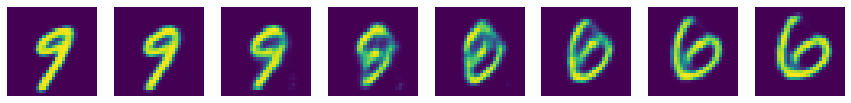

In [13]:
# CODE FOR PART 1.3b IN THIS CELL
test_data, _ = next(iter(loader_test))
x_inter = []

model.eval()
with torch.no_grad():
    mu1, var1 = model.encode(test_data[11].view(-1,1,28,28).to(device))
    mu2, var2 = model.encode(test_data[20].view(-1,1,28,28).to(device))
    z1 = model.reparametrize(mu1, var1)
    z2 = model.reparametrize(mu2, var2)
    alpha = np.linspace(0,1,8)

    for i in range(len(alpha)):
        recon_x = model.decode(z1*alpha[i] + z2*(1-alpha[i])) # Linear interpolation
        x_inter.append(recon_x)

_, axs = plt.subplots(1, 8, figsize=(15,15))
for i in range(len(x_inter)):
    axs[i].axis('off')
    axs[i].imshow(x_inter[i].cpu().view(28,28))

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

Here I choose digits 9 and 6 and print out all the images during transition. We can see clearly that one digit slowly transforms to another, the two digits become integrated in the middle of interpolation, and the middle digits sharing features from both digits. In the T-SNE visualisation, this can be seen as we start in one label distribution (the grey cluster) and end up in another nearby distribution (the purple cluster). The exact transition path in the T-SNE image (2D) is not clear, as the interpolation happens in a much higher-dimensional space. 

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [4]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [5]:
batch_size = 128 # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


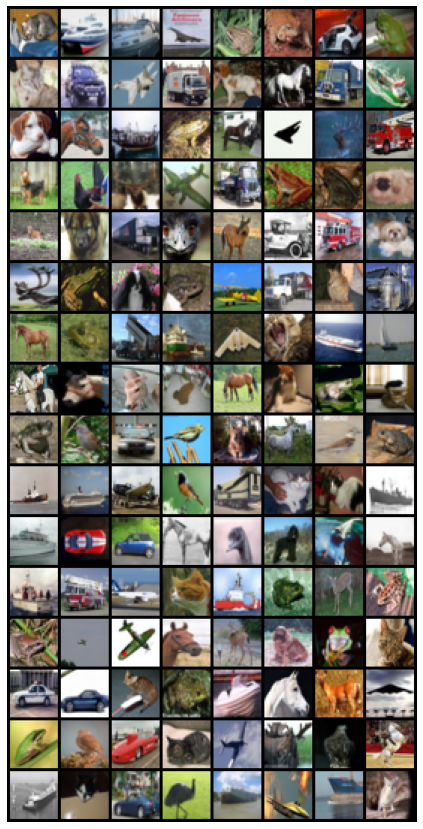

In [6]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [7]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 100
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams

In [8]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.generator = nn.Sequential(
            nn.ConvTranspose2d(latent_vector_size, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 3, 4, 2, 1, bias=False),
            nn.Tanh())
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        x = self.generator(z)
        return x

    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.decode(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        return out




class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.discriminator = nn.Sequential(
            nn.Conv2d(3, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid())
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        out = self.discriminator(x)
        return out

    def forward(self, x):   
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.encode(x)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        return out.view(-1, 1).squeeze(1)

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [9]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [10]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448576
Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2637312
Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [11]:
# You can modify the arguments of this function if needed
def loss_function(out, label):
    loss = nn.BCELoss(reduction='mean')(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [12]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [13]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
real_label = 0.9
fake_label = 0.1
# Additional input variables should be defined here

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [14]:
train_losses_G = []
train_losses_D = []

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            # train with real
            model_D.zero_grad()
            real_cpu = data[0].to(device)
            batch_size = real_cpu.size(0)

            label = torch.full((batch_size,), real_label, dtype=torch.float, device=device)
            output = model_D(real_cpu).to(torch.float32)

            errD_real = loss_function(output, label)
            errD_real.backward()
            D_x = output.mean().item()

            # train with fake
            noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
            fake = model_G(noise)
            label.fill_(fake_label)

            output = model_D(fake.detach())
            errD_fake = loss_function(output, label)
            errD_fake.backward()

            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            train_loss_D += errD.item()

            optimizerD.step()


            # (2) Update G network: maximize log(D(G(z)))
            model_G.zero_grad()
            label.fill_(real_label)  
            output = model_D(fake)
            errG = loss_function(output, label)
            errG.backward()
            D_G_z2 = output.mean().item()
            train_loss_G += errG.item()
            optimizerG.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), str(content_path/'CW_GAN/fake_samples_epoch_%03d.png') % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
    
# save models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Epoch 99: 100%|██████████| 391/391 [00:43<00:00,  8.96batch/s, D_G_z=0.130/0.064, D_x=0.896, Loss_D=0.663, Loss_G=2.53]


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


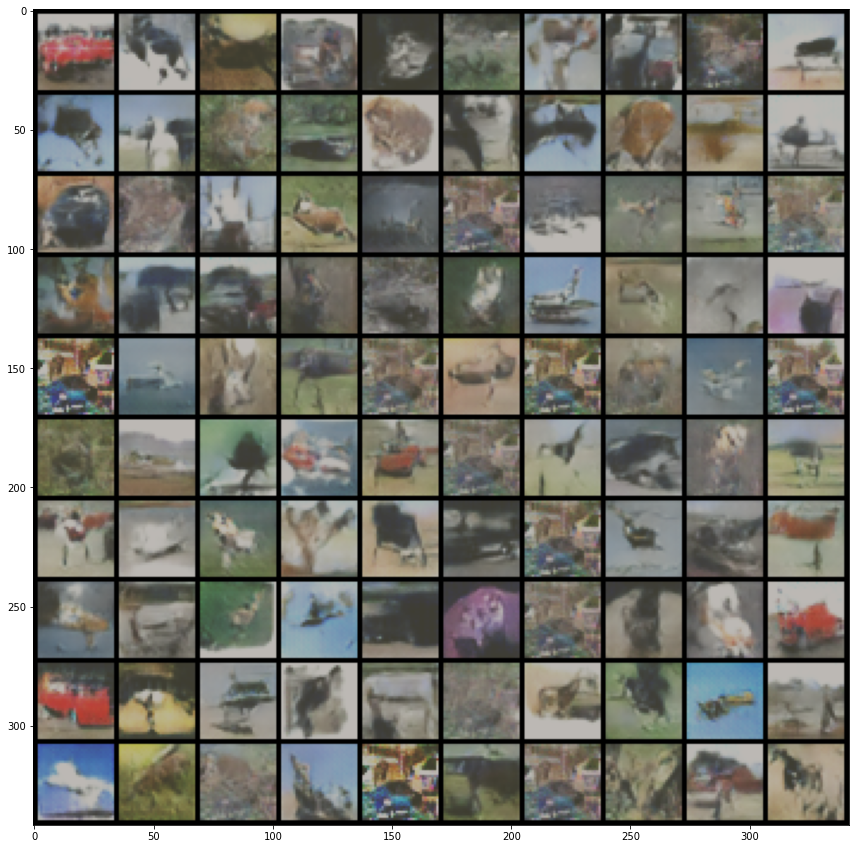

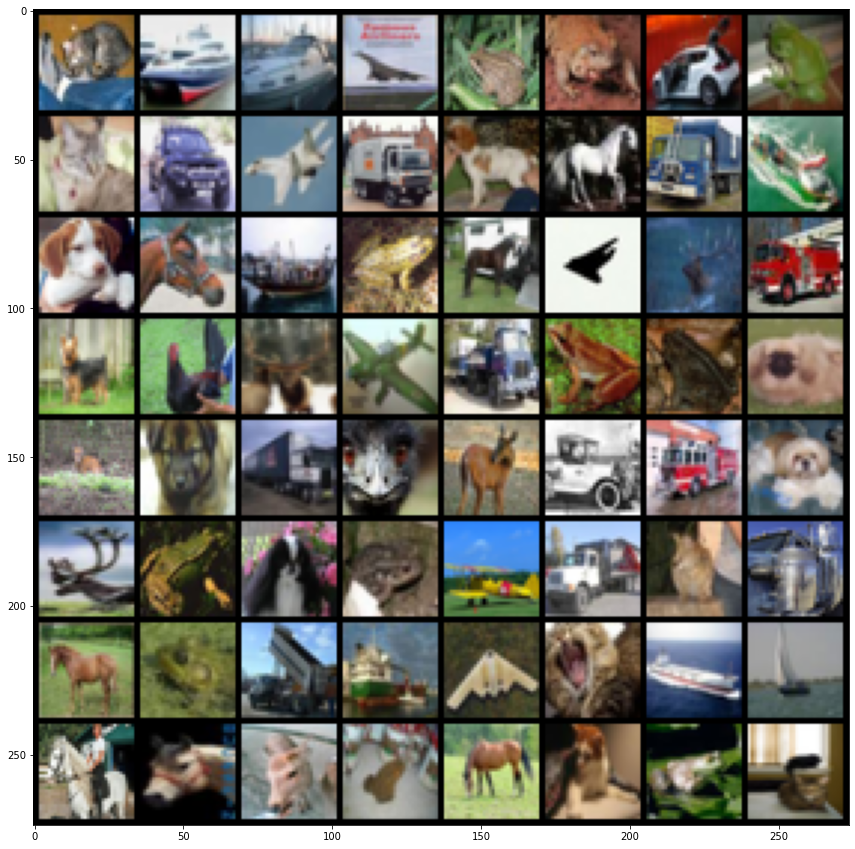

In [15]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

**Empirical useful methods I utilise:**

*  For the generator model in DCGAN, I used 4 ConvTranspose2d layers with a 
BatchNorm layer in between. While the transposed convolutions upsample the image inputs and fill in the features of the images during training, batch normalisation improves the speed and stability of training. I use ReLU as an activation function for all hidden layers and Tanh() for the output layer to normalise output images in the range of (-1, +1). Using Relu for the generator helps to prevent the vanishing gradient problem.

*  For the discriminator model, I use 4 Conv2d layers with a BatchNorm layer in between. I used LeakyReLU as the activation function for all hidden layers and Sigmoid() for the output layer to give probability outputs. Leaky ReLU prevents the discriminator from producing zero outputs by allowing negative values to pass through. This enables the generator to receive gradient values of the discriminator and learn. 

*  I set the learning rate to be 0.001 and the number of epochs to be 100.


**What worked and what didn't work:**

*  Adding the BatchNorm layers helps to improve the quality of output images immediately. 
*  Adam SGD with a modest batch size of 128 images, the learning rate of 0.0002 and momentum of 0.5 are the best set of hyperparameters I found for training both networks. It helps to speed up training and reduce training instability. 
*  Increasing the number of epochs (from 50 to 100) does not help to stabilise the loss curves and the convergence of the GAN. 
*  Using label smooth (by setting the target label value to be 0.9 instead of 1) does not seem to have a huge impact on the loss curve, but may be helpful to correct overconfidence and prevent the optimisation from being too greedy.


**Potentially helpful tricks to improve performance:**
*  Try different loss functions may help improve the quality of generated images, e.g. using Wasserstein loss, adding a regularised term to the orginal GAN loss function to enable the discriminator to score the provided inputs. 

*  Feature matching: expand the generator's goal from beating the opponent to matching features in real images, by modifiying the generator's loss function to minimizing the difference between features of the real images and the generated images. This introduces randomness that makes the discriminator harder to overfit itself, helps to mitigate mode collapse and stablise training.

*  Experience replay: Rather than fitting the models with only current generated images, we can feed the discriminator with all recent generated images, maintained from the past optimisation iterations. This prevents the optimisation for the discriminator from being too greedy defeating what the generator is currently generating.


## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

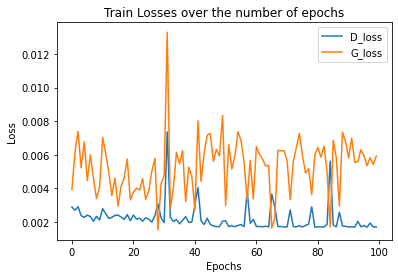

In [16]:
# ANSWER FOR PART 2.2 IN THIS CELL*
plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='D_loss')
plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='G_loss')
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title('Train Losses over the number of epochs')
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

Ideally, we wish to see relatively smooth loss curves showing convergence in the end. But my loss curves are highly fluctuated and unstable, with little evidence that they are converging. This is quite common and may be related to the inherent instability of GAN training, where it is tough to find an equilibrium state in optimising two competing networks. This also shows some evidence of mode collapse in the model, where the generator jumps between different modes.

We can still spot some general trends in the graph. For example, for the generator, the loss seems to be decreasing in the first 20 epochs, followed by a slightly increasing trend afterwards. This is sensible, as it shows the generator's progress, from only taking random noise and generating blurry images to actively reproducing the data and making hard-to-distinguish fake images to trick the discriminator. 

For the discriminator, there seems to be an overall decreasing trend in the loss, despite the small slope. This is also sensible, as it shows that the discriminator is actively learning to maximise the chance of picking out "fake" images produced by the generator with increasingly better quality. There are multiple rounds of the min-max process, where both networks optimise their objectives in turn. The fact that the discriminator loss is smaller than the generator loss is expected in GAN training.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

### Discussion


**YOUR ANSWER**

Mode collapse happens when each iteration of generator over-optimizes for a particular discriminator, and the discriminator never manages to learn its way out of this trap (e.g. it gets stuck in a local minimum). So the generator will produce only a small set of output samples that seems most plausible to the discriminator. In essence, this means the generator learns to map several different input $z$ values to the same output point.

I did notice evidence of mode collapse in my generated images, as the output images do show some repetitive shapes and all the images appear to be gray.

To cope with mode collapse, I tried to increase the latent feature's dimension from 100 to 200 but this does not seem to help. I also tried to increase the complexity of the network architecture, so it contains 4 convolutional layers instead of 3. I tuned the hyperparameters in Adam SGD and have chosen the set of hyperparameters giving the most stablised losses and the most diverse generated images.

Other ways to combat mode collapse:

*  Using the Wasserstein loss: Wasserstein loss can alleviate mode collapse by training the discriminator to optimality without seeing vanishing gradients. If the discriminator doesn't get stuck in local minima, it learns to reject the outputs that the generator stabilizes on. So the generator has to try something new.

*  Using Unrolled GANs: Unrolled GANs use a generator loss function that incorporates not only the current discriminator's classifications, but also the outputs of future discriminator versions. So the generator can't over-optimize for a single discriminator.





# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
sample_inputs, _ = next(iter(loader_test))
vae_input = sample_inputs[:32, :, :, :]

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(128, gan_latent_size, 1, 1, device=device) # Batch size for GAN is 128
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)